In [ ]:
!pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 569 kB 9.2 MB/s 


In [ ]:
import numpy as np
import sklearn
import shap
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from sklearn.linear_model import LogisticRegression

np.random.seed(1)

Mean with Component 2 = 5 and Sigma = 1

In [ ]:
mean_class_0 = np.array([0, 0, 0])
cov_class_0 = np.eye(3)
class_0_features = np.random.multivariate_normal(mean_class_0, cov_class_0, 200)
class_0_labels = np.ones((200, 1))*0

In [ ]:
mean_class_1 = np.array([0, 1, 5])
cov_class_1 = np.eye(3)
class_1_features = np.random.multivariate_normal(mean_class_1, cov_class_1, 200)
class_1_labels = np.ones((200, 1))*1

In [ ]:
features = np.concatenate((class_0_features, class_1_features), axis=0)
labels = np.concatenate((class_0_labels, class_1_labels), axis=0)

In [ ]:
data = np.concatenate((features, labels), axis=1)
np.random.shuffle(data)

In [ ]:
df = pd.DataFrame(data, columns=["Component 0", "Component 1", "Component 2", "Label"])

In [ ]:
lr = LogisticRegression()
lr.fit(X=df.iloc[:, :-1].values, y=df.iloc[:, -1].values)

LogisticRegression()

In [ ]:
lr_explainer = shap.KernelExplainer(lr.predict, df.iloc[:, :-1].values)

In [ ]:
lr_shap_values = lr_explainer.shap_values(df.iloc[:, :-1].values)

  0%|          | 0/400 [00:00<?, ?it/s]

Class 1 Feature Values:  [ 0.19829972  0.11900865 -0.67066229]
Class 1 SHAP Values:  [ 0.      -0.00125 -0.50125]
Class 2 Feature Values:  [-0.20633091  1.02117183  5.42865874]
Class 2 SHAP Values:  [0.     0.     0.4975]


Text(0.5, 1.0, 'Example SHAP Values, Class 2')

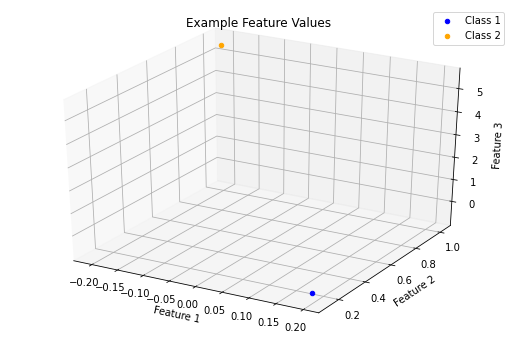

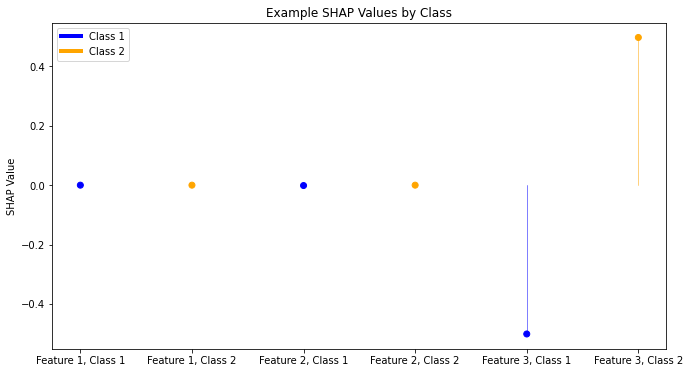

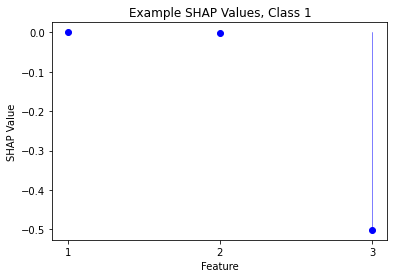

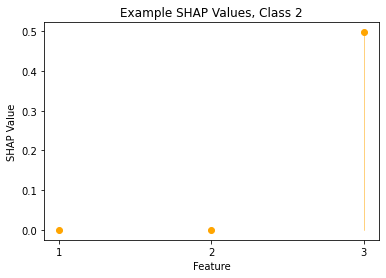

In [ ]:
class_0_row = 25
class_1_row = 33

class_0_example = df.iloc[class_0_row, :-1].values
class_1_example = df.iloc[class_1_row, :-1].values

print("Class 1 Feature Values: ", class_0_example)
print("Class 1 SHAP Values: ", lr_shap_values[class_0_row])
print("Class 2 Feature Values: ", class_1_example)
print("Class 2 SHAP Values: ", lr_shap_values[class_1_row])

fig1 = plt.figure("Figure 1", figsize=(9, 6))
ax1 = plt.axes(projection='3d')

ax1.scatter3D(class_0_example[0], class_0_example[1], class_0_example[2], label="Class 1", color=["blue"])
ax1.scatter3D(class_1_example[0], class_1_example[1], class_1_example[2], label="Class 2", color=["orange"])

ax1.set_xlabel('Feature 1')
ax1.set_ylabel('Feature 2')
ax1.set_zlabel('Feature 3')
ax1.set_title('Example Feature Values')
ax1.legend()

fig2 = plt.figure("Figure 2", figsize=(11, 6))
ax2 = plt.axes()
ax2.scatter(["Feature 1, Class 1", "Feature 1, Class 2", "Feature 2, Class 1", "Feature 2, Class 2", "Feature 3, Class 1", "Feature 3, Class 2"], [lr_shap_values[class_0_row, 0], lr_shap_values[class_1_row, 0], lr_shap_values[class_0_row, 1], lr_shap_values[class_1_row, 1], lr_shap_values[class_0_row, 2], lr_shap_values[class_1_row, 2]], c=["blue", "orange", "blue", "orange", "blue", "orange"])
ax2.plot([0, 0], [0, lr_shap_values[class_0_row, 0]], color="blue", linewidth=0.5)
ax2.plot([1, 1], [0, lr_shap_values[class_1_row, 0]], color="orange", linewidth=0.5)
ax2.plot([2, 2], [0, lr_shap_values[class_0_row, 1]], color="blue", linewidth=0.5)
ax2.plot([3, 3], [0, lr_shap_values[class_1_row, 1]], color="orange", linewidth=0.5)
ax2.plot([4, 4], [0, lr_shap_values[class_0_row, 2]], color="blue", linewidth=0.5)
ax2.plot([5, 5], [0, lr_shap_values[class_1_row, 2]], color="orange", linewidth=0.5)

ax2.set_ylabel("SHAP Value")
ax2.set_title('Example SHAP Values by Class')
custom_legend = [Line2D([0], [0], color="blue", lw=4),
                Line2D([0], [0], color="orange", lw=4)]
ax2.legend(custom_legend, ["Class 1", "Class 2"])

fig3 = plt.figure("Figure 3")
ax3 = plt.axes()
ax3.scatter(range(1,4), [lr_shap_values[class_0_row, 0], lr_shap_values[class_0_row, 1], lr_shap_values[class_0_row, 2]], c=["blue"])

for i in range(1,len(class_0_example)+1):
  ax3.plot([i, i], [0, lr_shap_values[class_0_row, i-1]], color="blue", linewidth=0.5)

ax3.set_xticks([1, 2, 3])
ax3.set_xlabel('Feature')
ax3.set_ylabel('SHAP Value')
ax3.set_title('Example SHAP Values, Class 1')

fig4 = plt.figure("Figure 4")
ax4 = plt.axes()
ax4.scatter(range(1,4), [lr_shap_values[class_1_row, 0], lr_shap_values[class_1_row, 1], lr_shap_values[class_1_row, 2]], c=["orange"])

for i in range(1,len(class_1_example)+1):
  ax4.plot([i, i], [0, lr_shap_values[class_1_row, i-1]], color="orange", linewidth=0.5)

ax4.set_xticks([1, 2, 3])
ax4.set_xlabel('Feature')
ax4.set_ylabel('SHAP Value')
ax4.set_title('Example SHAP Values, Class 2')

Text(0.5, 1.0, 'All SHAP Values, Class 2')

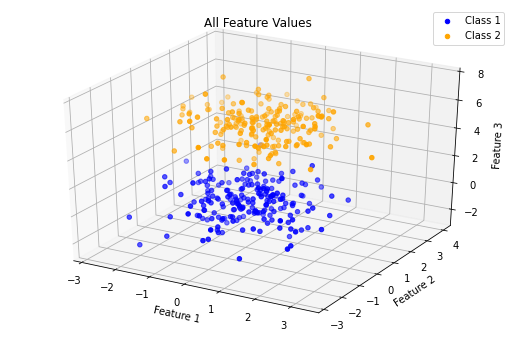

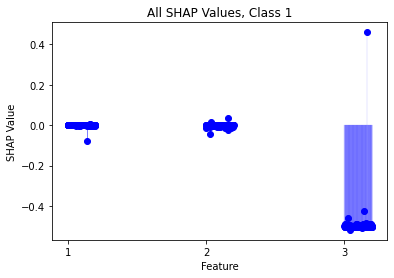

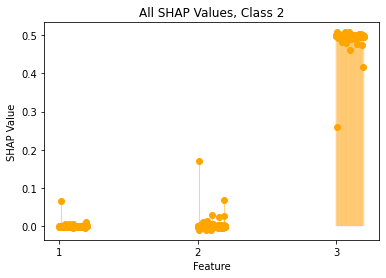

In [ ]:
fig5 = plt.figure("Figure 5", figsize=(9, 6))
ax5 = plt.axes(projection='3d')

ax5.scatter3D(class_0_features[:, 0], class_0_features[:, 1], class_0_features[:, 2], label="Class 1", color=["blue"])
ax5.scatter3D(class_1_features[:, 0], class_1_features[:, 1], class_1_features[:, 2], label="Class 2", color=["orange"])
ax5.set_xlabel('Feature 1')
ax5.set_ylabel('Feature 2')
ax5.set_zlabel('Feature 3')
ax5.set_title('All Feature Values')
ax5.legend()

class_0_indices = df.index[df['Label'] == 0].values
class_1_indices = df.index[df['Label'] == 1].values

lr_0_shap_values = lr_shap_values[class_0_indices]
lr_1_shap_values = lr_shap_values[class_1_indices]

feature_indices_0_0 = np.ones(len(lr_0_shap_values), )
increment = 0
index = 0
for i in feature_indices_0_0:
  i = i + increment
  feature_indices_0_0[index] = i
  increment = increment + 0.001
  index = index + 1

feature_indices_1_0 = np.ones(len(lr_0_shap_values), )+1
increment = 0
index = 0
for i in feature_indices_1_0:
  i = i + increment
  feature_indices_1_0[index] = i
  increment = increment + 0.001
  index = index + 1

feature_indices_2_0 = np.ones(len(lr_0_shap_values), )+2
increment = 0
index = 0
for i in feature_indices_2_0:
  i = i + increment
  feature_indices_2_0[index] = i
  increment = increment + 0.001
  index = index + 1

fig6 = plt.figure("Figure 6")
ax6 = plt.axes()
ax6.scatter(feature_indices_0_0, [lr_0_shap_values[:, 0]], c=["blue"])
ax6.scatter(feature_indices_1_0, [lr_0_shap_values[:, 1]], c=["blue"])
ax6.scatter(feature_indices_2_0, [lr_0_shap_values[:, 2]], c=["blue"])

index = 0
for i in feature_indices_0_0:
  ax6.plot([i, i], [0, lr_0_shap_values[index, 0]], color="blue", linewidth=0.5)
  index = index + 1

index = 0
for i in feature_indices_1_0:
  ax6.plot([i, i], [0, lr_0_shap_values[index, 1]], color="blue", linewidth=0.5)
  index = index + 1

index = 0
for i in feature_indices_2_0:
  ax6.plot([i, i], [0, lr_0_shap_values[index, 2]], color="blue", linewidth=0.1)
  index = index + 1

ax6.set_xticks([1, 2, 3])
ax6.set_xlabel('Feature')
ax6.set_ylabel('SHAP Value')
ax6.set_title('All SHAP Values, Class 1')

feature_indices_0_1 = np.ones(len(lr_1_shap_values), )
increment = 0
index = 0
for i in feature_indices_0_1:
  i = i + increment
  feature_indices_0_1[index] = i
  increment = increment + 0.001
  index = index + 1

feature_indices_1_1 = np.ones(len(lr_1_shap_values), )+1
increment = 0
index = 0
for i in feature_indices_1_1:
  i = i + increment
  feature_indices_1_1[index] = i
  increment = increment + 0.001
  index = index + 1

feature_indices_2_1 = np.ones(len(lr_1_shap_values), )+2
increment = 0
index = 0
for i in feature_indices_2_1:
  i = i + increment
  feature_indices_2_1[index] = i
  increment = increment + 0.001
  index = index + 1

fig7 = plt.figure("Figure 7")
ax7 = plt.axes()

ax7.scatter(feature_indices_0_1, [lr_1_shap_values[:, 0]], c=["orange"])
ax7.scatter(feature_indices_1_1, [lr_1_shap_values[:, 1]], c=["orange"])
ax7.scatter(feature_indices_2_1, [lr_1_shap_values[:, 2]], c=["orange"])

index = 0
for i in feature_indices_0_1:
  ax7.plot([i, i], [0, lr_1_shap_values[index, 0]], color="orange", linewidth=0.5)
  index = index + 1

index = 0
for i in feature_indices_1_1:
  ax7.plot([i, i], [0, lr_1_shap_values[index, 1]], color="orange", linewidth=0.5)
  index = index + 1

index = 0
for i in feature_indices_2_1:
  ax7.plot([i, i], [0, lr_1_shap_values[index, 2]], color="orange", linewidth=0.1)
  index = index + 1

ax7.set_xticks([1, 2, 3])
ax7.set_xlabel('Feature')
ax7.set_ylabel('SHAP Value')
ax7.set_title('All SHAP Values, Class 2')

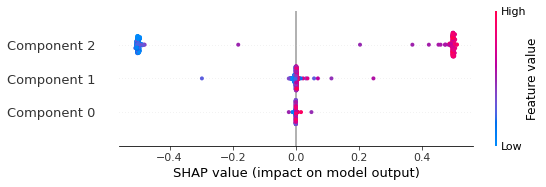

In [ ]:
shap.summary_plot(lr_shap_values, df.iloc[:, :-1])

In [ ]:
shap.initjs()
shap.force_plot(lr_explainer.expected_value, lr_shap_values[0, :], df.iloc[0, :-1])

In [ ]:
shap.initjs()
shap.force_plot(lr_explainer.expected_value, lr_shap_values[1, :], df.iloc[1, :-1])

In [ ]:
shap.initjs()
shap.force_plot(lr_explainer.expected_value, lr_shap_values[2, :], df.iloc[2, :-1])

In [ ]:
shap.initjs()
shap.force_plot(lr_explainer.expected_value, lr_shap_values[3, :], df.iloc[3, :-1])

In [ ]:
shap.initjs()
shap.force_plot(lr_explainer.expected_value, lr_shap_values[4, :], df.iloc[4, :-1])

In [ ]:
shap.initjs()
shap.force_plot(lr_explainer.expected_value, lr_shap_values[5, :], df.iloc[5, :-1])

In [ ]:
shap.initjs()
shap.force_plot(lr_explainer.expected_value, lr_shap_values[6, :], df.iloc[6, :-1])

In [ ]:
shap.initjs()
shap.force_plot(lr_explainer.expected_value, lr_shap_values[7, :], df.iloc[7, :-1])

Mean with Component 2 = 3 and Sigma = 1

In [ ]:
mean_class_1 = np.array([0, 1, 3])
cov_class_1 = np.eye(3)
class_1_features = np.random.multivariate_normal(mean_class_1, cov_class_1, 200)
class_1_labels = np.ones((200, 1))*1

In [ ]:
features = np.concatenate((class_0_features, class_1_features), axis=0)
labels = np.concatenate((class_0_labels, class_1_labels), axis=0)

In [ ]:
data = np.concatenate((features, labels), axis=1)
np.random.shuffle(data)

In [ ]:
df = pd.DataFrame(data, columns=["Component 0", "Component 1", "Component 2", "Label"])

In [ ]:
lr = LogisticRegression()
lr.fit(X=df.iloc[:, :-1].values, y=df.iloc[:, -1].values)

LogisticRegression()

In [ ]:
lr_explainer = shap.KernelExplainer(lr.predict, df.iloc[:, :-1].values)

Using 400 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


In [ ]:
lr_shap_values = lr_explainer.shap_values(df.iloc[:, :-1].values)

  0%|          | 0/400 [00:00<?, ?it/s]

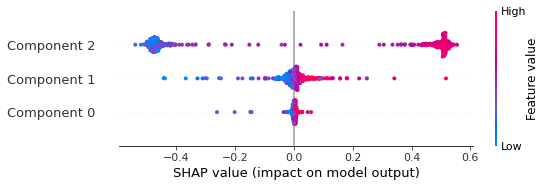

In [ ]:
shap.summary_plot(lr_shap_values, df.iloc[:, :-1])

In [ ]:
shap.initjs()
shap.force_plot(lr_explainer.expected_value, lr_shap_values[0, :], df.iloc[0, :-1])

In [ ]:
shap.initjs()
shap.force_plot(lr_explainer.expected_value, lr_shap_values[1, :], df.iloc[1, :-1])

In [ ]:
shap.initjs()
shap.force_plot(lr_explainer.expected_value, lr_shap_values[2, :], df.iloc[2, :-1])

In [ ]:
shap.initjs()
shap.force_plot(lr_explainer.expected_value, lr_shap_values[3, :], df.iloc[3, :-1])

In [ ]:
shap.initjs()
shap.force_plot(lr_explainer.expected_value, lr_shap_values[4, :], df.iloc[4, :-1])

In [ ]:
shap.initjs()
shap.force_plot(lr_explainer.expected_value, lr_shap_values[5, :], df.iloc[5, :-1])

In [ ]:
shap.initjs()
shap.force_plot(lr_explainer.expected_value, lr_shap_values[6, :], df.iloc[6, :-1])

In [ ]:
shap.initjs()
shap.force_plot(lr_explainer.expected_value, lr_shap_values[7, :], df.iloc[7, :-1])

Mean with Component 2 = 5 and Sigma = 1.5

In [ ]:
mean_class_1 = np.array([0, 1, 5])
cov_class_1 = np.eye(3)*1.5
class_1_features = np.random.multivariate_normal(mean_class_1, cov_class_1, 200)
class_1_labels = np.ones((200, 1))*1

In [ ]:
features = np.concatenate((class_0_features, class_1_features), axis=0)
labels = np.concatenate((class_0_labels, class_1_labels), axis=0)

In [ ]:
data = np.concatenate((features, labels), axis=1)
np.random.shuffle(data)

In [ ]:
df = pd.DataFrame(data, columns=["Component 0", "Component 1", "Component 2", "Label"])

In [ ]:
lr = LogisticRegression()
lr.fit(X=df.iloc[:, :-1].values, y=df.iloc[:, -1].values)

LogisticRegression()

In [ ]:
lr_explainer = shap.KernelExplainer(lr.predict, df.iloc[:, :-1].values)

Using 400 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


In [ ]:
lr_shap_values = lr_explainer.shap_values(df.iloc[:, :-1].values)

  0%|          | 0/400 [00:00<?, ?it/s]

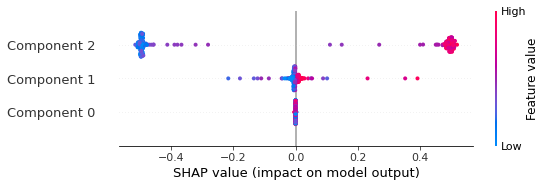

In [ ]:
shap.summary_plot(lr_shap_values, df.iloc[:, :-1])

In [ ]:
shap.initjs()
shap.force_plot(lr_explainer.expected_value, lr_shap_values[0, :], df.iloc[0, :-1])

In [ ]:
shap.initjs()
shap.force_plot(lr_explainer.expected_value, lr_shap_values[1, :], df.iloc[1, :-1])

In [ ]:
shap.initjs()
shap.force_plot(lr_explainer.expected_value, lr_shap_values[2, :], df.iloc[2, :-1])

In [ ]:
shap.initjs()
shap.force_plot(lr_explainer.expected_value, lr_shap_values[3, :], df.iloc[3, :-1])

In [ ]:
shap.initjs()
shap.force_plot(lr_explainer.expected_value, lr_shap_values[4, :], df.iloc[4, :-1])

In [ ]:
shap.initjs()
shap.force_plot(lr_explainer.expected_value, lr_shap_values[5, :], df.iloc[5, :-1])

In [ ]:
shap.initjs()
shap.force_plot(lr_explainer.expected_value, lr_shap_values[6, :], df.iloc[6, :-1])

In [ ]:
shap.initjs()
shap.force_plot(lr_explainer.expected_value, lr_shap_values[7, :], df.iloc[7, :-1])

Mean with Component 2 = 3 and Sigma = 1.5

In [ ]:
mean_class_1 = np.array([0, 1, 3])
cov_class_1 = np.eye(3)*1.5
class_1_features = np.random.multivariate_normal(mean_class_1, cov_class_1, 200)
class_1_labels = np.ones((200, 1))*1

In [ ]:
features = np.concatenate((class_0_features, class_1_features), axis=0)
labels = np.concatenate((class_0_labels, class_1_labels), axis=0)

In [ ]:
data = np.concatenate((features, labels), axis=1)
np.random.shuffle(data)

In [ ]:
df = pd.DataFrame(data, columns=["Component 0", "Component 1", "Component 2", "Label"])

In [ ]:
lr = LogisticRegression()
lr.fit(X=df.iloc[:, :-1].values, y=df.iloc[:, -1].values)

LogisticRegression()

In [ ]:
lr_explainer = shap.KernelExplainer(lr.predict, df.iloc[:, :-1].values)

Using 400 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


In [ ]:
lr_shap_values = lr_explainer.shap_values(df.iloc[:, :-1].values)

  0%|          | 0/400 [00:00<?, ?it/s]

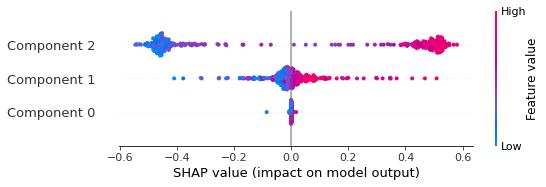

In [ ]:
shap.summary_plot(lr_shap_values, df.iloc[:, :-1])

In [ ]:
shap.initjs()
shap.force_plot(lr_explainer.expected_value, lr_shap_values[0, :], df.iloc[0, :-1])

In [ ]:
shap.initjs()
shap.force_plot(lr_explainer.expected_value, lr_shap_values[1, :], df.iloc[1, :-1])

In [ ]:
shap.initjs()
shap.force_plot(lr_explainer.expected_value, lr_shap_values[2, :], df.iloc[2, :-1])

In [ ]:
shap.initjs()
shap.force_plot(lr_explainer.expected_value, lr_shap_values[3, :], df.iloc[3, :-1])

In [ ]:
shap.initjs()
shap.force_plot(lr_explainer.expected_value, lr_shap_values[4, :], df.iloc[4, :-1])

In [ ]:
shap.initjs()
shap.force_plot(lr_explainer.expected_value, lr_shap_values[5, :], df.iloc[5, :-1])

In [ ]:
shap.initjs()
shap.force_plot(lr_explainer.expected_value, lr_shap_values[6, :], df.iloc[6, :-1])

In [ ]:
shap.initjs()
shap.force_plot(lr_explainer.expected_value, lr_shap_values[7, :], df.iloc[7, :-1])